## Seed Rank Plot
This project measures the gene coverage of optimal, real and random seeds. 

The two Main functions are 'generate_all_count()' and 'plot_seed_rank()'. These two functions are runnable with genome_filename, mature_filename, canon_site, replacement parameters. 

generate_all_count() will count the number of genes covered by a seed. It counts the gene coverage for real, random, and optimal seeds, then ranks the seeds from most covered to least covered. This data is then stored in a file under 'Final Seed Count'. The names of each seed is not recorded.

plot_seed_rank() takes the real, random, and optimal data from 'Final Seed Count' and plots them against each other.

In [3]:
import pandas as pd
from numpy import loadtxt
import time
import os
import random
import numpy as np
import ast
import itertools as it
import matplotlib.font_manager
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import matplotlib.patches as mpatches

In [16]:
species_list = [
    ('Lamprey genes (Pmarinus_7.0)','Sea Lamprey (Petromyzon marinus)'),
    ('Hagfish genes (Eburgeri_3.2)','Inshore hagfish (Eptatretus burgeri)'),
    ('Elephant shark genes (Callorhinchus_milii-6.1.3)','Australian ghostshark (Callorhinchus milii)'),
    ('Spotted gar genes (LepOcu1)','Spotted gar (Lepisosteus oculatus)'),
    ('Zebrafish genes (GRCz11)','Zebrafish (Danio rerio)'),
    ('Atlantic cod genes (gadMor3.0)','Cod (Gadus morhua)'),
    ('Coelacanth genes (LatCha1)','Coelacanth (Latimeria chalumnae)'),
    ('Tropical clawed frog genes (Xenopus_tropicalis_v9.1)','Tropical clawed frog (Xenopus tropicalis)'),
    ('Tuatara genes (ASM311381v1)','Tuatara (Sphenodon punctatus)'),
    ('Green anole genes (AnoCar2.0v2)','Green anole lizard (Anolis carolinensis)'),
    ('Painted turtle genes (Chrysemys_picta_bellii-3.0.3)','Western painted turtle (Chrysemys picta bellii)'),
    ('Zebra finch genes (bTaeGut1_v1.p)','Zebra finch (Taeniopygia guttata)'),
    ('Chicken (maternal Broiler) genes (bGalGal1.mat.broiler.GRCg7b)','Chicken (Gallus gallus)'),
    ('Platypus genes (mOrnAna1.p.v1)','Platypus (Ornithorhynchus anatinus)'),
    ('Opossum genes (ASM229v1)','Gray short-tailed opossum (Monodelphis domestica)'),
    ('Armadillo genes (Dasnov3.0)','Nine-banded armadillo (Dasypus novemcinctus)'),
    ('Cow genes (ARS-UCD1.2)','Cow (Bos taurus)'),
    ('Dog genes (ROS_Cfam_1.0)','Dog (Canis familiaris)'),
    ('Rabbit genes (OryCun2.0)','Rabbit (Oryctolagus cuniculus)'),
    ('Guinea Pig genes (Cavpor3.0)','Guinea pig (Cavia porcellus)'),
    ('Rat genes (mRatBN7.2)','Norway rat (Rattus norvegicus)'),
    ('Mouse genes (GRCm39)','House mouse (Mus musculus)'),
    ('Human genes (GRCh38.p13)','Human (Homo sapiens)'),
    ('Human TargetScan','Human (Homo sapiens) TargetScan'),
    ('All','All')
]

In [4]:
def seed_count(seed_list, genome, replacement):
    genome = [*set(genome)]
    seed_count_array = []
    for seed in seed_list:
        count = 0
        cover_list = []
        for gene in genome:
            if seed in gene:
                count+=1
                cover_list.append(gene)
        seed_count_array.append(count)
        if replacement == False:
            genome = [i for i in genome if i not in cover_list]
    return seed_count_array

In [5]:
def count_real_seeds(genome_filename, mature_filename, canon_site, genome, replacement):
    start_time = time.time()
    
    #returns real coverage and seed number from mature data
    df = pd.read_csv("Mature Data/"+mature_filename+'.csv')
    
    #We are ignoring Pre and Post for this project
    real_seeds = df['Seed']
    
    #create reverse compliments
    real_seeds = [sub.replace('A', 'X') for sub in real_seeds]
    real_seeds = [sub.replace('U', 'A') for sub in real_seeds]
    real_seeds = [sub.replace('X', 'T') for sub in real_seeds]
    real_seeds = [sub.replace('C', 'X') for sub in real_seeds]
    real_seeds = [sub.replace('G', 'C') for sub in real_seeds]
    real_seeds = [sub.replace('X', 'G') for sub in real_seeds]
    real_seeds = [sub[::-1] for sub in real_seeds]
    
    #If canon site A or C, append A at the end
    if canon_site == 'A':
        real_seeds = [item[:-1]+'A' for item in real_seeds]
    elif canon_site == 'C':
        real_seeds = [item+'A' for item in real_seeds]
    #remove repeats
    real_seeds = [*set(real_seeds)]
    
    global REAL_SEED_COUNT
    REAL_SEED_COUNT = len(real_seeds)
    
    #generate seed_count
    count_data = seed_count(real_seeds, genome, replacement)
    
    #save data 
    new_file_path = "Final Seed Count/"+genome_filename+"/Canon Site "+canon_site+"/Replacement_"+str(replacement)
    if not os.path.exists(new_file_path):
        os.makedirs(new_file_path)
    with open(new_file_path+"/real.txt", "w") as output:
        output.write(str(count_data))
        
    print("Real done in %s seconds!" % (time.time()-start_time))

In [6]:
def count_optimal_seeds(genome_filename, mature_filename, canon_site, genome, replacement):
    #takes in the optimal_seed_set for a given species and canon_site
    start_time = time.time()
    
    #retrieve optimal seeds
    new_file_path = "Optimal Seed Set/"+genome_filename + " Seed Set/Canon Site "+canon_site+"/"+str(random.randint(0,14))+".txt"
    with open(new_file_path, 'r') as f:
            optimal_seeds = ast.literal_eval(f.read())
    global REAL_SEED_COUNT
    if REAL_SEED_COUNT == -1:
        print("ERROR: You have not retrieved the REAL_SEED_COUNT, run count_real_seeds() first and try again")
        return
    optimal_seeds = optimal_seeds[0:REAL_SEED_COUNT]
    
    #generate seed_count
    count_data = seed_count(optimal_seeds, genome, replacement)
    
    #save data 
    new_file_path = "Final Seed Count/"+genome_filename+"/Canon Site "+canon_site+"/Replacement_"+str(replacement)
    if not os.path.exists(new_file_path):
        os.makedirs(new_file_path)
    with open(new_file_path+"/optimal.txt", "w") as output:
        output.write(str(count_data))
        
    print("Optimal done in %s seconds!" % (time.time()-start_time))

In [7]:
def randSeeds(canon_site, size):
    if canon_site == 'A':
        motif_list = [''.join(i) for i in it.product('AGCT', repeat=6)]
        motif_list = [item + 'A' for item in motif_list]
        sample = random.sample(motif_list,size)
    elif canon_site == 'B':
        motif_list = [''.join(i) for i in it.product('AGCT', repeat=7)]
        sample = random.sample(motif_list,size)
    elif canon_site == 'C':
        motif_list = [''.join(i) for i in it.product('AGCT', repeat=7)]
        motif_list = [item + 'A' for item in motif_list]
        sample = random.sample(motif_list,size)
    return sample

In [8]:
def count_random_seeds(genome_filename, mature_filename, canon_site, genome, replacement):
    #generates random seeds
    start_time = time.time()
    
    #generate random seeds
    global REAL_SEED_COUNT
    if REAL_SEED_COUNT == -1:
        print("ERROR: You have not retrieved the REAL_SEED_COUNT, run count_real_seeds() first and try again")
        return
    random_seeds = randSeeds(canon_site, REAL_SEED_COUNT)
    
    #generate seed_count
    count_data = seed_count(random_seeds, genome, replacement)
    
    #save data 
    new_file_path = "Final Seed Count/"+genome_filename+"/Canon Site "+canon_site+"/Replacement_"+str(replacement)
    if not os.path.exists(new_file_path):
        os.makedirs(new_file_path)
    with open(new_file_path+"/random.txt", "w") as output:
        output.write(str(count_data))
        
    print("Random done in %s seconds!" % (time.time()-start_time))

In [17]:
def generate_all_count(genome_filename, mature_filename, canon_site, replacement):
    #retrieve genome data
    if genome_filename == 'All':
        genome = []
        for species in species_list:
            if species[0]!='All':
                temp_data = loadtxt("Genome Data/"+species[0]+".txt", comments=">",dtype="str")
                #remove all the Unavailable sequences and sequences that are too short
                allowed_char = 'AGCT'
                temp_data = list(filter(lambda a: all(ch in allowed_char for ch in a) and len(a)>7, temp_data))
                print(species[0]+": "+str(len(temp_data)))
                genome = genome+temp_data
    else:
        genome = loadtxt("Genome Data/"+genome_filename+".txt", comments=">",dtype="str")
    allowed_char = 'AGCT'
    genome = list(filter(lambda a: all(ch in allowed_char for ch in a) and len(a)>7, genome))
    
    REAL_SEED_COUNT = -1
    
    count_real_seeds(genome_filename, mature_filename, canon_site, genome, replacement)
    count_optimal_seeds(genome_filename, mature_filename, canon_site, genome, replacement)
    count_random_seeds(genome_filename, mature_filename, canon_site, genome, replacement)

In [20]:
sites = ['A','B','C']
replacements = [True,False]
for species in species_list:
    for site in sites:
        for replacement in replacements:
            generate_all_count(species[0],species[1],site, replacement)

Real done in 0.11644291877746582 seconds!
Optimal done in 0.08648800849914551 seconds!
Random done in 0.09869384765625 seconds!
Real done in 0.05003094673156738 seconds!
Optimal done in 0.014626264572143555 seconds!
Random done in 0.04594707489013672 seconds!
Real done in 0.12436795234680176 seconds!
Optimal done in 0.09832000732421875 seconds!
Random done in 0.11657881736755371 seconds!
Real done in 0.05517888069152832 seconds!
Optimal done in 0.01381993293762207 seconds!
Random done in 0.053849220275878906 seconds!
Real done in 0.12298297882080078 seconds!
Optimal done in 0.09308791160583496 seconds!
Random done in 0.1178290843963623 seconds!
Real done in 0.09088683128356934 seconds!
Optimal done in 0.025881052017211914 seconds!
Random done in 0.09305787086486816 seconds!
Real done in 5.9134521484375 seconds!
Optimal done in 4.047904968261719 seconds!
Random done in 5.889626979827881 seconds!
Real done in 1.2030730247497559 seconds!
Optimal done in 0.6732962131500244 seconds!
Random 

Random done in 4.713298797607422 seconds!
Real done in 1.6915688514709473 seconds!
Optimal done in 0.6607639789581299 seconds!
Random done in 2.116300106048584 seconds!
Real done in 16.26824712753296 seconds!
Optimal done in 12.225322008132935 seconds!
Random done in 17.582386016845703 seconds!
Real done in 3.0825247764587402 seconds!
Optimal done in 2.0373802185058594 seconds!
Random done in 3.107959032058716 seconds!
Real done in 17.1091468334198 seconds!
Optimal done in 13.030450105667114 seconds!
Random done in 16.293543100357056 seconds!
Real done in 2.871379852294922 seconds!
Optimal done in 2.0133540630340576 seconds!
Random done in 3.275386095046997 seconds!
Real done in 20.001359701156616 seconds!
Optimal done in 14.486644983291626 seconds!
Random done in 19.92677617073059 seconds!
Real done in 4.538486957550049 seconds!
Optimal done in 2.1840338706970215 seconds!
Random done in 5.717149972915649 seconds!
Real done in 19.12023115158081 seconds!
Optimal done in 16.1295828819274

Random done in 10.568635940551758 seconds!
Real done in 57.95776104927063 seconds!
Optimal done in 47.044658184051514 seconds!
Random done in 58.43466520309448 seconds!
Real done in 14.68917727470398 seconds!
Optimal done in 9.594466209411621 seconds!
Random done in 17.21015501022339 seconds!
Real done in 107.01406216621399 seconds!
Optimal done in 85.21156978607178 seconds!
Random done in 107.37605881690979 seconds!
Real done in 28.45416522026062 seconds!
Optimal done in 26.342950105667114 seconds!
Random done in 28.498510122299194 seconds!
Real done in 111.11733889579773 seconds!
Optimal done in 98.32178926467896 seconds!
Random done in 114.31887698173523 seconds!
Real done in 27.91272282600403 seconds!
Optimal done in 26.608115911483765 seconds!
Random done in 29.26668405532837 seconds!
Real done in 133.49230098724365 seconds!
Optimal done in 102.97372007369995 seconds!
Random done in 126.70522999763489 seconds!
Real done in 34.406208992004395 seconds!
Optimal done in 26.88700795173

In [36]:
def plot_seed_rank(genome_filename, mature_filename, canon_site, replacement):
    #retrieve real data
    new_file_path = "Final Seed Count/"+genome_filename + "/Canon Site "+canon_site+"/Replacement_"+str(replacement)+"/real.txt"
    with open(new_file_path, 'r') as f:
            real_data = ast.literal_eval(f.read())
    real_data.sort(reverse = True)
            
    #retrieve optimal data
    new_file_path = "Final Seed Count/"+genome_filename + "/Canon Site "+canon_site+"/Replacement_"+str(replacement)+"/optimal.txt"
    with open(new_file_path, 'r') as f:
            optimal_data = ast.literal_eval(f.read())
    optimal_data.sort(reverse = True)
            
    #retrieve random data
    new_file_path = "Final Seed Count/"+genome_filename + "/Canon Site "+canon_site+"/Replacement_"+str(replacement)+"/random.txt"
    with open(new_file_path, 'r') as f:
            random_data = ast.literal_eval(f.read())
    random_data.sort(reverse = True)
    
    #x data
    x_real = list(range(len(real_data)))
    x_opt = list(range(len(optimal_data)))
    x_rand = list(range(len(random_data)))
    
    #font
    font = {'family' : 'Helvetica',
        'weight' : 'bold',
        'size'   : 18}
    plt.rc('font', **font)
    
    #figure
    fig,ax = plt.subplots(figsize=(12,10))
    fig.patch.set_facecolor('white')
    if replacement == False: 
        replace_title = "Without Replacement"
    else:
        replace_title = "With Replacement"
    plt.title(genome_filename+" "+replace_title+" Canon Site "+canon_site)
    plt.xlabel("Seed")
    plt.ylabel("Covered Genes")
    
    #plot
    ax.plot(x_rand, random_data, color ='#f3b432', label='Random', linewidth=2)
    ax.plot(x_real, real_data, color ='#cb275a', label='Real', linewidth=2)
    ax.plot(x_opt, optimal_data, color ='#ed5a31', label='Optimal', linewidth=2)
    
    #legend
    plt.rcParams.update({'font.size': 12})
    patches = [0]*3
    patches[0] = mpatches.Patch(color='#f3b432', label='Random')
    patches[1] = mpatches.Patch(color='#cb275a', label='Real')
    patches[2] = mpatches.Patch(color='#ed5a31', label='Optimal')
    plt.legend(handles=patches)
    
    #zoom in
    if not replacement:
        plt.rcParams.update({'font.size': 12})
        plt.rcParams.update({'font.weight': 'normal'})
        plt.xlim(right=np.quantile(x_real, 0.60))
        axins1 = zoomed_inset_axes(ax, zoom = 2, loc=7)
        axins1.plot(x_rand, random_data, color ='#f3b432', label='Random', linewidth=2)
        axins1.plot(x_real, real_data, color ='#cb275a', label='Real', linewidth=2)
        axins1.plot(x_opt, optimal_data, color ='#ed5a31', label='Optimal', linewidth=2)
        x1, x2, y1, y2 = 0,np.quantile(x_real, 0.16),0,(max(optimal_data)*.4)
        axins1.set_xlim(x1, x2)
        axins1.set_ylim(y1, y2)
        mark_inset(ax, axins1, loc1=2, loc2=4, fc="none", ec="0.5")
        
    #save plot
    filename = "Plots/"+genome_filename+"/"
    if not os.path.exists(filename):
        os.makedirs(filename)
    plt.savefig(filename+" Canon Site "+canon_site+" "+replace_title+".svg", dpi = 120, facecolor=fig.get_facecolor())

/var/folders/wd/wcjpwvbx6ql2slnp2p7cvn2m0000gn/T/ipykernel_27721/2568275601.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(12,10))


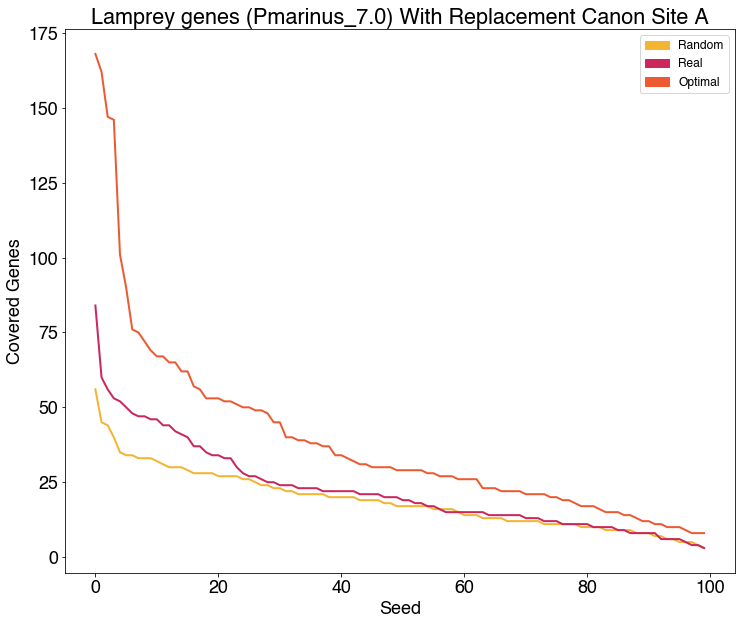

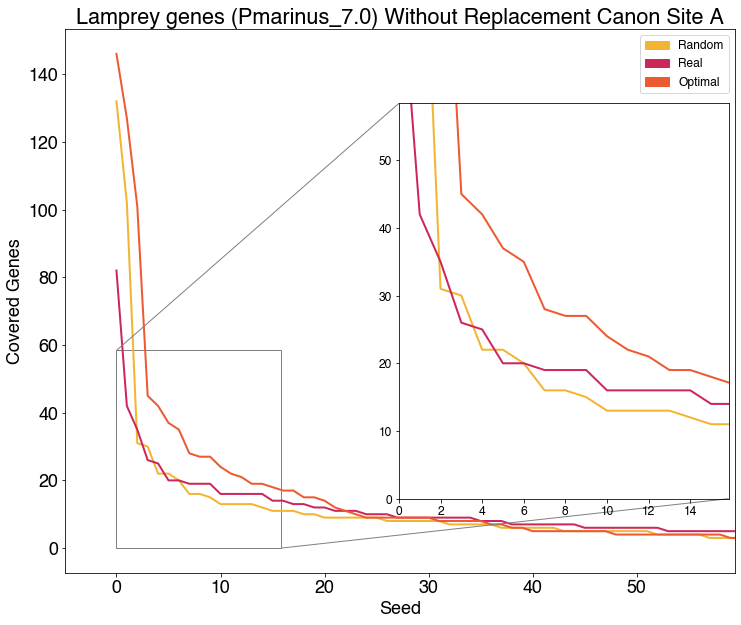

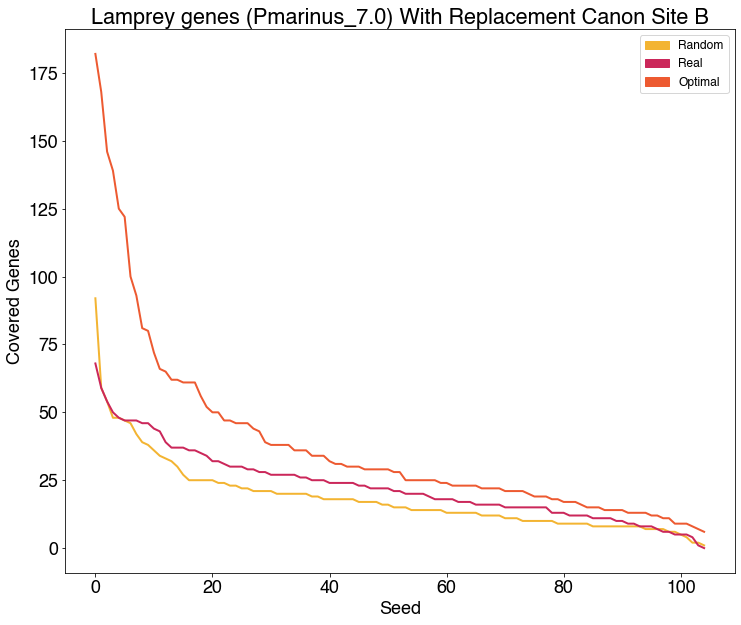

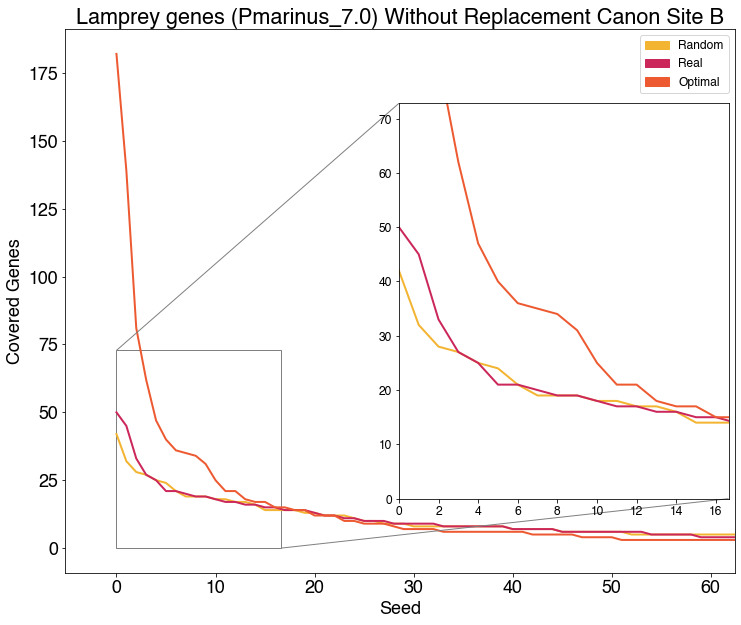

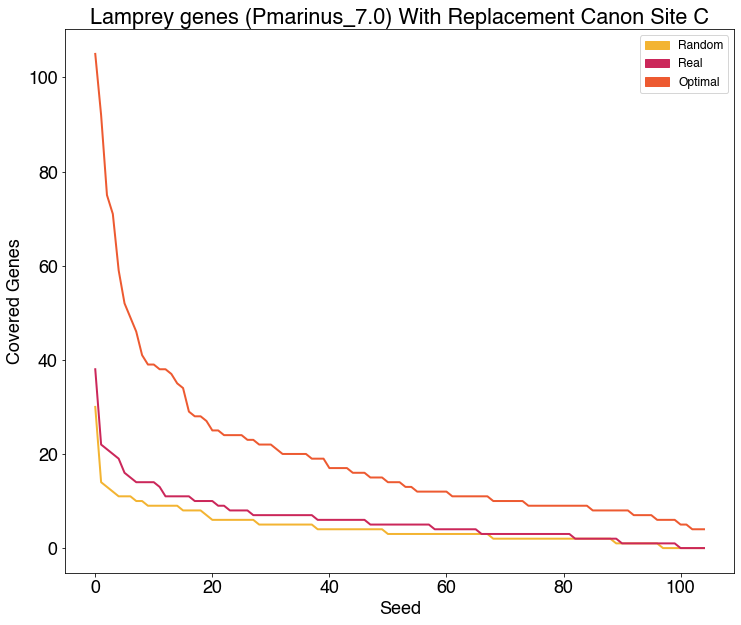

...

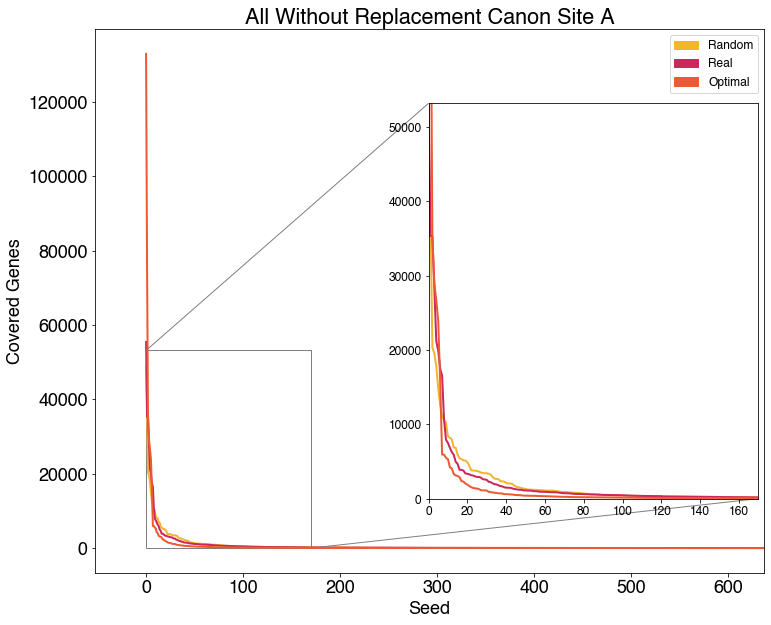

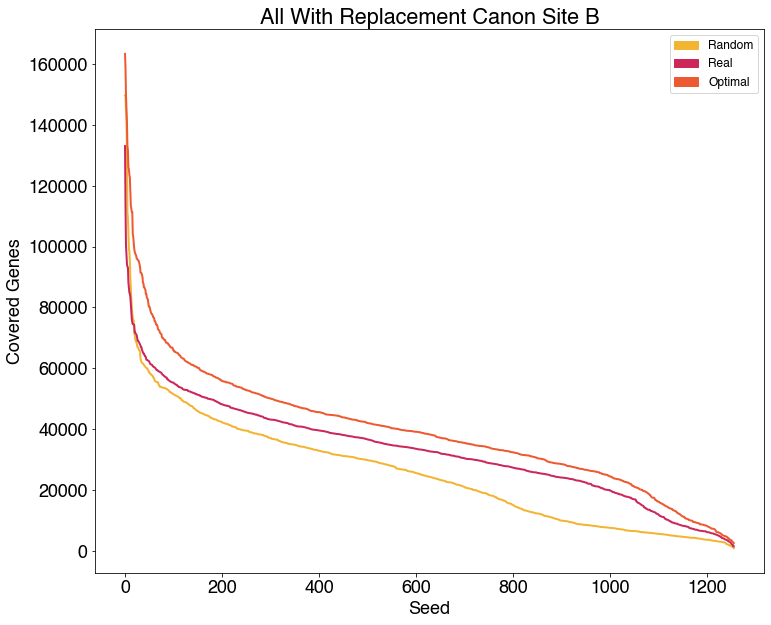

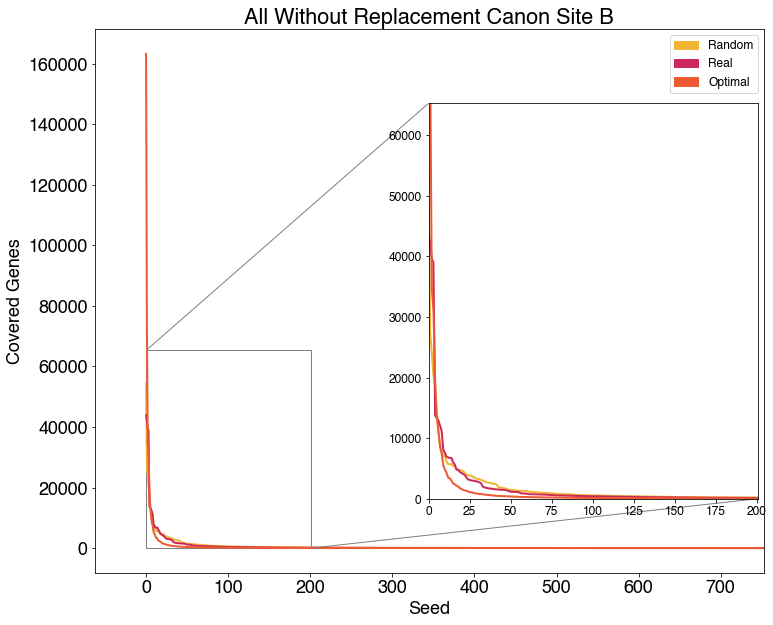

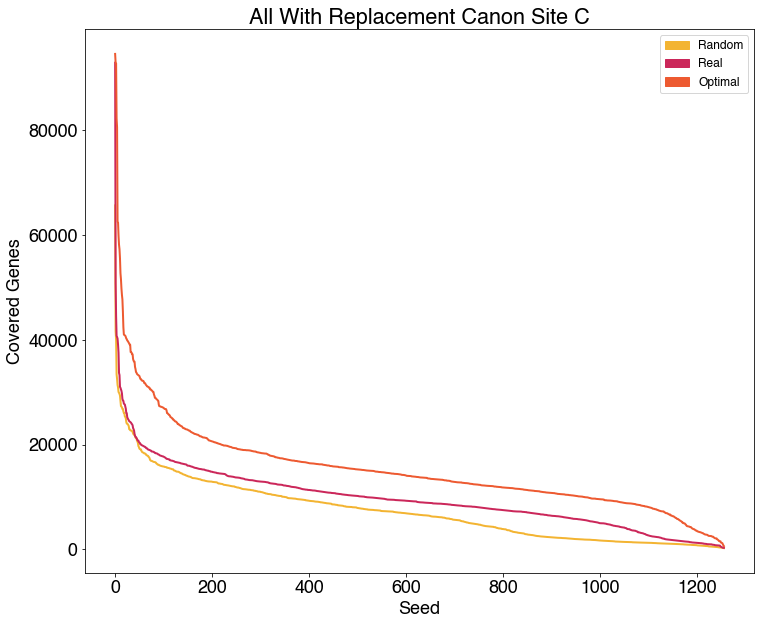

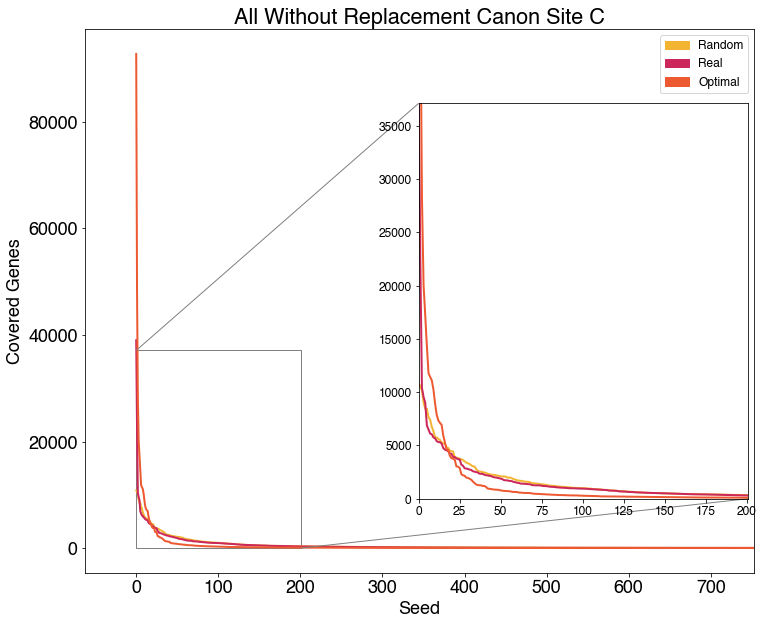

In [37]:
sites = ['A','B','C']
replacements = [True,False]
for species in species_list:
    for site in sites:
        for replacement in replacements:
            plot_seed_rank(species[0],species[1],site, replacement)

In [569]:
import matplotlib.font_manager
from IPython.core.display import HTML

def make_html(fontname):
    return "<p>{font}: <span style='font-family:{font}; font-size: 24px;'>{font}</p>".format(font=fontname)

code = "\n".join([make_html(font) for font in sorted(set([f.name for f in matplotlib.font_manager.fontManager.ttflist]))])

HTML("<div style='column-count: 2;'>{}</div>".format(code))